<a href="https://colab.research.google.com/github/rafael-ariascalles/MachineLearningExamples/blob/main/Attrition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Libraries

In [ ]:
%%capture
!pip install pandas-profiling==2.7.1 imblearn

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import pandas_profiling 
from sklearn.preprocessing import MinMaxScaler, LabelBinarizer, OneHotEncoder,LabelEncoder
from sklearn.model_selection import train_test_split

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

from sklearn import tree
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA

from sklearn.model_selection import GridSearchCV

from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier,RandomForestClassifier,GradientBoostingClassifier,StackingClassifier,AdaBoostClassifier
from xgboost import XGBClassifier

from sklearn.impute import SimpleImputer
from sklearn_pandas import DataFrameMapper

# Setup

In [ ]:
#Pandas format for decimals
pd.options.display.float_format = "{:,.2f}".format
#Display of the ipynb 
from IPython.core.display import display,HTML
display(HTML("<style>.container{width:100% !important;}</style>"))

In [ ]:
def data_understanding(df):
    n_rows, n_columns = df.shape
    print("------------ SAMPLE DATA ----------------------")
    display(data.sample(10).head())
    print("Number of Columns: {} and Rows: {}".format(n_columns,n_rows))
    print("------------ INFORMATION ----------------------")
    print(df.info())
    print("------------ NUMERIC TYPE ---------------------")
    dm = df.describe()
    display(dm)
    print(dm.columns)
    print("------------ OBJECT TYPE ----------------------")
    dc = df.describe(include=["O"])
    display(dc)
    print(dc.columns)

def bar_correlation(corr_matrix,feature,threshold):
    plt.figure(figsize=(15,5))
    z = corr_matrix[feature].sort_values(ascending=False)
    z = z[abs(z.values) > threshold]
    sns.barplot(x=z.index, y=z.values)
    plt.xticks(rotation=90)
    plt.show()

def corr_plot(corr_matrix):
    plt.figure(figsize=(15,15))
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    sns.heatmap(corr_matrix,cmap=cmap)
    plt.show()

# Business Problem

##### Problem

The bank recently saw a steep decline in the number of users of their credit card

Analyze the data and identify the customers who will leave their credit card services and reason for same. The bank need to come up with a classification model that will help bank improve their services so that customers do not renounce their credit cards

##### Objective

* Build a classification model to predict if the customer is going to churn or not
* Generate a set of insights and recommendations that will help the bank

# Data Exploration and Processing


##### Data Dictionary

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then 1 else 0
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

### Data Retrieval

In [ ]:
data = pd.read_csv("drive/MyDrive/PGP-AIML/BankChurners.csv")

### Data Exploration

Stucture of the Data

In [ ]:
data_understanding(data)

------------ SAMPLE DATA ----------------------


,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Unnamed: 21
6745,713985183,Existing Customer,46,F,5,Graduate,Single,Less than $40K,Blue,38,4,5,2,"2,799.00",2412,387.00,0.88,4634,91,0.75,0.86,nan
6621,788771733,Existing Customer,49,M,4,High School,Single,$60K - $80K,Blue,30,5,3,3,"1,579.00",900,679.00,0.59,4354,70,0.71,0.57,nan
4616,793015083,Existing Customer,46,F,4,Graduate,Married,Unknown,Blue,40,5,3,4,"2,586.00",1270,"1,316.00",0.68,4481,77,0.93,0.49,nan
5099,718208358,Existing Customer,43,M,5,Uneducated,Married,$120K +,Blue,31,4,3,4,"34,516.00",830,"33,686.00",0.54,3789,57,0.54,0.02,nan
9068,719071158,Attrited Customer,54,F,0,Graduate,Single,Unknown,Platinum,38,2,2,2,"34,516.00",0,"34,516.00",0.69,3901,54,0.42,0.00,nan


Number of Columns: 22 and Rows: 10127
------------ INFORMATION ----------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     1012

,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Unnamed: 21
count,"10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00","10,127.00",0.00
mean,"739,177,606.33",46.33,2.35,35.93,3.81,2.34,2.46,"8,631.95","1,162.81","7,469.14",0.76,"4,404.09",64.86,0.71,0.27,nan
std,"36,903,783.45",8.02,1.30,7.99,1.55,1.01,1.11,"9,088.78",814.99,"9,090.69",0.22,"3,397.13",23.47,0.24,0.28,nan
min,"708,082,083.00",26.00,0.00,13.00,1.00,0.00,0.00,"1,438.30",0.00,3.00,0.00,510.00,10.00,0.00,0.00,nan
25%,"713,036,770.50",41.00,1.00,31.00,3.00,2.00,2.00,"2,555.00",359.00,"1,324.50",0.63,"2,155.50",45.00,0.58,0.02,nan
50%,"717,926,358.00",46.00,2.00,36.00,4.00,2.00,2.00,"4,549.00","1,276.00","3,474.00",0.74,"3,899.00",67.00,0.70,0.18,nan
75%,"773,143,533.00",52.00,3.00,40.00,5.00,3.00,3.00,"11,067.50","1,784.00","9,859.00",0.86,"4,741.00",81.00,0.82,0.50,nan
max,"828,343,083.00",73.00,5.00,56.00,6.00,6.00,6.00,"34,516.00","2,517.00","34,516.00",3.40,"18,484.00",139.00,3.71,1.00,nan


Index(['CLIENTNUM', 'Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Unnamed: 21'],
      dtype='object')
------------ OBJECT TYPE ----------------------


,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
count,10127,10127,10127,10127,10127,10127
unique,2,2,7,4,6,4
top,Existing Customer,F,Graduate,Married,Less than $40K,Blue
freq,8500,5358,3128,4687,3561,9436


Index(['Attrition_Flag', 'Gender', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category'],
      dtype='object')




*   These Dataset consist on different Dimenssions with 6 Categorical and 14 Numerical Variables.
*   It has 10,127 Observations with non null value 
*   Of the 22 Variables it will be drop Client ID and the last columns because of bad format Data Source
*   Target Variable is Attrition_flag with 2 classes (1 = Attrition)








Variable by its Rol in the Data

In [ ]:
target = 'Attrition_Flag'

In [ ]:
numeric_dim = [
    'Customer_Age'
    ,'Dependent_count'
    , 'Months_on_book'
    ,'Total_Relationship_Count'
    , 'Months_Inactive_12_mon'
    ,'Contacts_Count_12_mon'
    , 'Credit_Limit'
    , 'Total_Revolving_Bal'
    ,'Avg_Open_To_Buy'
    , 'Total_Amt_Chng_Q4_Q1'
    , 'Total_Trans_Amt'
    , 'Total_Trans_Ct'
    , 'Total_Ct_Chng_Q4_Q1'
    , 'Avg_Utilization_Ratio'
]

In [ ]:
categorical_dim = [
    'Gender'
    ,'Education_Level'
    ,'Marital_Status'
    ,'Income_Category'
    ,'Card_Category'
]

In [ ]:
data = data[[target]+numeric_dim+categorical_dim].copy()

Exploratory Data Analysis

In [ ]:
baseline_report = pandas_profiling.ProfileReport(data,progress_bar=False,minimal=False)

In [ ]:
baseline_report.to_notebook_iframe()

##### Overview

there are 20 Variables (14 Numeric + 6 Categorical) of wicht none have Missing V
alues

There are no Duplicated Rows

Eventhougth this Dataset do not present Null values, we have some variables wher
e the number Zero appears in 24.4% in Total Revolving Balance and Avg Utilizatio
n Ration.

The average Utilization Ratio it should deppend on variables in the Dataset

Avg Open to Buy and Credit Limit has high correlation, this could be because Avg
 Open To Buy is a function of the Credit Limit and the Credit Limit of a Card doesn´t change much in Time (almost 1 time in a year)


##### Variables

the Variable Age has a normal distribution and it doesnt looks to 
have outliers

Month on Books has a value that represent the 24.3% of the total observation. the value is 36, indicating that 25% of the sample has been generated 3 years ago.


WIth respect to the total relationship count , 75% pf the sample has equal or more than 3 Products.       

In the Months inactive 12 months, the maximun resgistered is 6 , beeing 1 to 3 months inactive the 83%

Contact Count 12 Months, have maximun 6 total contact in 12 months




For the multivariate analysis it will be transform all the categorical variables and target into numeric representation, these is just for Exploratory purpose.

In [ ]:
preprocessing_def = []
for name in categorical_dim:
    preprocessing_def.append(([name],[LabelBinarizer()]))

#for name in numeric_dim:
#    preprocessing_def.append(([name],[SimpleImputer(),MinMaxScaler()]))

In [ ]:
mapper_eda = DataFrameMapper(preprocessing_def,df_out=True)

In [ ]:
target_eda = data.Attrition_Flag.map({'Existing Customer':0, 'Attrited Customer':1})
features_eda = mapper_eda.fit_transform(data)

In [ ]:
eda = pd.concat([target_eda,data[numeric_dim],features_eda],1)

In [ ]:
corr = eda.corr()

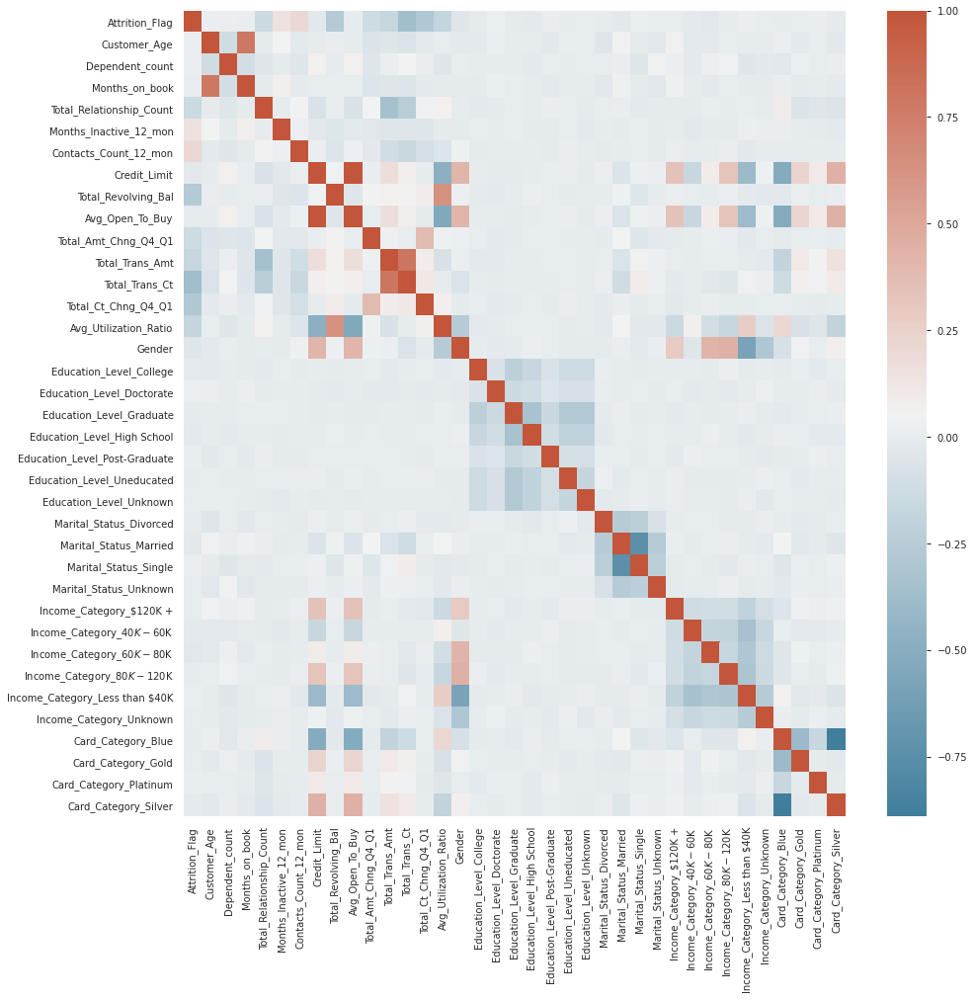

In [ ]:
corr_plot(corr)

it seems like there is a type of interaction between variables like 
Utilization Ration, Avg Open to Buy ,Credit Limit ,Total Trans Amt ,Total Trans Ct ,Credit Limit,Total Relationship ,Gender and Attrition Flag. But given that almost all the columns are Binary transformation these interation will be better capture with a ML Model.

the variables that have High Correlation are Customer Age with Month on Book. it Should be Drop the customer Age, but these variable could be of use in interpretation an Bussines Insights.

Given that Avg Open to Buy & Credit Limit have high correlation, it Should be Drop the Credit Limit (Also), but given the interpretation that could have it would be use in the training process. 

Also given there exists enought transactional variables it will be Drop the variable Gender. Althougth it seems like it has correlation between attrition or not, these variable should not be use given that can carrie out unconscious bias.

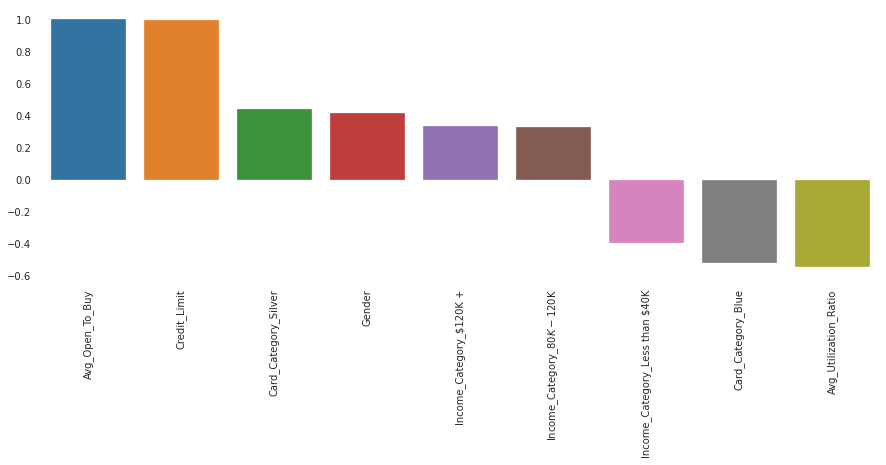

In [ ]:
bar_correlation(corr,"Avg_Open_To_Buy",0.30)

Avg Open to Buy is a computation using Credit Limit

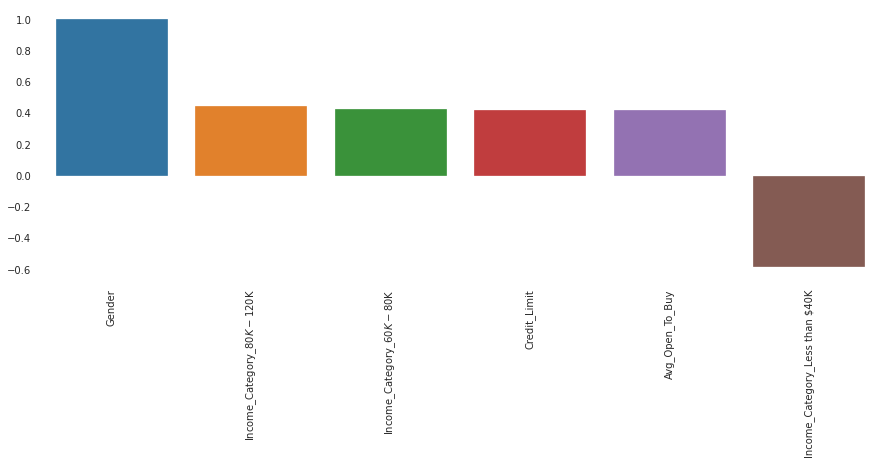

In [ ]:
bar_correlation(corr,"Gender",0.30)

For the Gender, there are some moderate correlation between Income Categories and Avg Open to Buy, so it will be not use these Variable

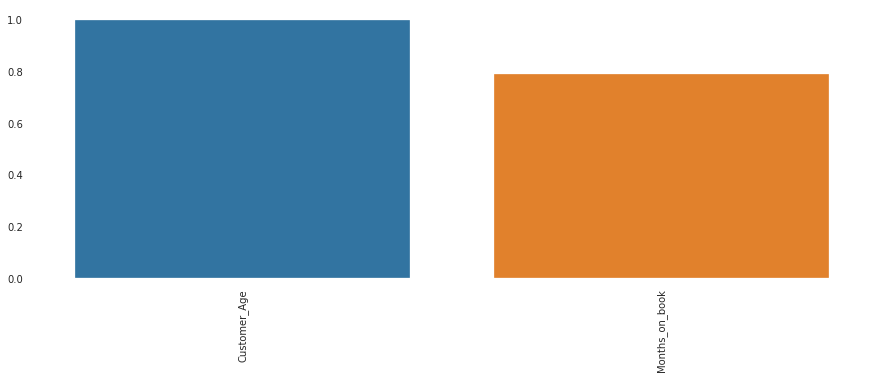

In [ ]:
bar_correlation(corr,"Customer_Age",0.30)

### Data Processing

In [ ]:
#data = eda.copy()

In [ ]:
target = 'Attrition_Flag'

In [ ]:
#numeric_dim = [n for n in numeric_dim if n not in ['Customer_Age','Credit_Limit']] 

In [ ]:
categorical_dim = [n for n in categorical_dim if n != 'Gender']

In [ ]:
features = data[numeric_dim+categorical_dim].copy()

In [ ]:
#features.drop('Gender',inplace=True,axis=1)

In [ ]:
target_value = data.Attrition_Flag.map({'Existing Customer':0, 'Attrited Customer':1}).to_numpy()

In [ ]:
X_train , X_test, y_train, y_test = train_test_split(features,target_value,test_size=0.2,stratify=target_value,random_state=7614)

In [ ]:
randomOverSampler = RandomOverSampler()
X_train_res, y_train_res = randomOverSampler.fit_resample(X_train, y_train.ravel())
X_train_res = pd.DataFrame(X_train_res,columns=X_train.columns)

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
preprocessing_def = []
for name in categorical_dim:
    preprocessing_def.append(([name],[SimpleImputer(strategy="most_frequent"),LabelBinarizer()]))
    
for name in numeric_dim:
    preprocessing_def.append(([name],[SimpleImputer(),MinMaxScaler()]))

In [ ]:
for d in preprocessing_def:
    print(d)

(['Education_Level'], [SimpleImputer(add_indicator=False, copy=True, fill_value=None,
              missing_values=nan, strategy='most_frequent', verbose=0), LabelBinarizer(neg_label=0, pos_label=1, sparse_output=False)])
(['Marital_Status'], [SimpleImputer(add_indicator=False, copy=True, fill_value=None,
              missing_values=nan, strategy='most_frequent', verbose=0), LabelBinarizer(neg_label=0, pos_label=1, sparse_output=False)])
(['Income_Category'], [SimpleImputer(add_indicator=False, copy=True, fill_value=None,
              missing_values=nan, strategy='most_frequent', verbose=0), LabelBinarizer(neg_label=0, pos_label=1, sparse_output=False)])
(['Card_Category'], [SimpleImputer(add_indicator=False, copy=True, fill_value=None,
              missing_values=nan, strategy='most_frequent', verbose=0), LabelBinarizer(neg_label=0, pos_label=1, sparse_output=False)])
(['Customer_Age'], [SimpleImputer(add_indicator=False, copy=True, fill_value=None,
              missing_values=nan

In [ ]:
mapper = DataFrameMapper(preprocessing_def,df_out=True)

# Modeling

### Training



In [ ]:
pipe = Pipeline([("pre_processing", mapper), ("clf", LogisticRegression(max_iter=1000))])

In [ ]:
param_grid = dict(
    #clf=[LogisticRegression(max_iter=1000),RandomForestClassifier()]
    clf__C = [1,100]
)
grid_search = GridSearchCV(pipe, param_grid=param_grid,cv=7)

In [ ]:
grid_search.fit(X_train_res,y_train_res)

GridSearchCV(cv=7, error_score=nan,
             estimator=Pipeline(memory=None,
                                steps=[('pre_processing',
                                        DataFrameMapper(default=False,
                                                        df_out=True,
                                                        features=[(['Education_Level'],
                                                                   [SimpleImputer(add_indicator=False,
                                                                                  copy=True,
                                                                                  fill_value=None,
                                                                                  missing_values=nan,
                                                                                  strategy='most_frequent',
                                                                                  verbose=0),
                                  

In [ ]:
scores = grid_search.cv_results_['mean_test_score']
scores_std = grid_search.cv_results_['std_test_score']

In [ ]:
grid_search.best_params_

{'clf__C': 100}

### Evaluation

# Business Insight (Pre Deployment)

### Insight

### Recommendation